**Table of contents**<a id='toc0_'></a>    
- [ARマーカ検出](#toc1_)    
- [ARマーカを貼り付けたボックスの作成](#toc2_)    
  - [ボックスに張り付ける用のARマーカのテクスチャの作成](#toc2_1_)    
  - [Blenderでボックスにテクスチャを張り付ける](#toc2_2_)    
    - [ボックスの作成](#toc2_2_1_)    
    - [テクスチャの読み込み](#toc2_2_2_)    
    - [テクスチャのスケールの変更](#toc2_2_3_)    
    - [objファイルのエクスポート](#toc2_2_4_)    
  - [ARマーカーを貼り付けたボックスのurdfファイルの作成](#toc2_3_)    
- [Pybulletを用いて、ARマーカを検出](#toc3_)    
  - [pybulletの起動](#toc3_1_)    
  - [pybulletの初期設定](#toc3_2_)    
  - [カメラ、ARマーカを貼り付けたボックスの生成](#toc3_3_)    
  - [光源位置の変更](#toc3_4_)    
  - [ARマーカを検出する関数の定義](#toc3_5_)    
  - [カメラに関するパラメータの定義](#toc3_6_)    
  - [debugParameterの定義](#toc3_7_)    
  - [ARマーカ検出の実行](#toc3_8_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

# <a id='toc1_'></a>[ARマーカ検出](#toc0_)

本notebookでは、pybulletで使用するための「ARマーカを張り付けたボックスの作成方法」「ARマーカを張り付けたボックスの位置姿勢の取得方法」について解説します。

pybulletで使用可能な関数がまとめられたマニュアルについては[こちら](https://github.com/bulletphysics/bullet3/blob/master/docs/pybullet_quickstartguide.pdf)を参照してください。

# <a id='toc2_'></a>[ARマーカを貼り付けたボックスの作成](#toc0_)

最初に、ARマーカを貼り付けたボックスを作成します。

なお、作成済みのobj, urdf, pngファイルは以下に格納されているため、単にARマーカの検出を試したい場合は本章はスキップしてOKです。
- pngファイル（テクスチャファイル）： `texture/ar_marker_box.png`
- objファイル： `obj/ar_marker_box.obj`
- urdfファイル： `urdf/ar_marker_box.urdf`



## <a id='toc2_1_'></a>[ボックスに張り付ける用のARマーカのテクスチャの作成](#toc0_)
ボックスに貼り付ける用のARマーカのテクスチャを作成します。  

なお、ARマーカの上下左右には一定の余白が必要なので、余白も考慮したテクスチャを作成します。  
具体的には、以下のテクスチャを作成します。
- 10cm×10cmのARマーカ
- ARマーカの上下左右に2cmの余白を設ける
- ARマーカのサイズと余白を含めた1面のサイズは14cm×14cm

以下コードを実行すると、下図のようなテクスチャが生成されます。


![](../texture/ar_marker_box.png)

※ 以下コードは、 `utility/generate_marker.py` にも格納されています

In [1]:
import cv2
import numpy as np

# arucoライブラリの辞書を定義
arucoDict = cv2.aruco.Dictionary_get(cv2.aruco.DICT_4X4_50)

# IDが0のマーカを生成
markerId = 0
markerSize = 1000  # マーカのサイズ（ピクセル）
markerImg = np.zeros((markerSize, markerSize), dtype=np.uint8)
markerImg = cv2.aruco.drawMarker(arucoDict, markerId, markerSize, markerImg, 1)

# マーカのサイズを10cmにするためのピクセル数（DPIを100とする）
dpi = 100
cmToInch = 2.54
markerSizeCm = 10
markerSizeInch = markerSizeCm / cmToInch
markerSizePixel = int(dpi * markerSizeInch)

# 余白のサイズ（2cm）
marginCm = int(markerSizeCm) * 0.2 # 20%の余白
marginInch = marginCm / cmToInch
marginPixel = int(dpi * marginInch)

# ボックスの辺の長さ
boxSizeCm = marginCm + markerSizeCm
boxSizeInch = boxSizeCm / cmToInch
boxSizePixel = int(dpi * boxSizeInch)

# 白いキャンバスを作成
canvasWidth = 4 * boxSizePixel
canvasHeight = 3 * boxSizePixel
canvas = 255 * np.ones((canvasWidth, canvasHeight), dtype=np.uint8)

# マーカーをリサイズして余白を設ける
resizedMarker = cv2.resize(markerImg, (markerSizePixel, markerSizePixel))
markerWithMargin = 255 * np.ones((boxSizePixel, boxSizePixel), dtype=np.uint8)
startPoint = (boxSizePixel - markerSizePixel) // 2
markerWithMargin[startPoint:startPoint + markerSizePixel, startPoint:startPoint + markerSizePixel] = resizedMarker

# 中央の一面（展開図の中央）にマーカーを配置
canvas[boxSizePixel:2 * boxSizePixel, boxSizePixel:2 * boxSizePixel] = markerWithMargin

# 画像を保存
outputFile = '../texture/ar_marker_box.png'
cv2.imwrite(outputFile, canvas)

print(f"立方体の展開図を{outputFile}に保存しました。")

立方体の展開図を../texture/ar_marker_box.pngに保存しました。


## <a id='toc2_2_'></a>[Blenderでボックスにテクスチャを張り付ける](#toc0_)

次に、Blenderを使用してボックスにテクスチャを張り付けます。

### <a id='toc2_2_1_'></a>[ボックスの作成](#toc0_)

blenderを起動し、余白を含めた1面のサイズのボックス（上記の例の場合、14cm×14cm×14cm）を作成します。

なお、blenderでは、m単位であることに注意してください。

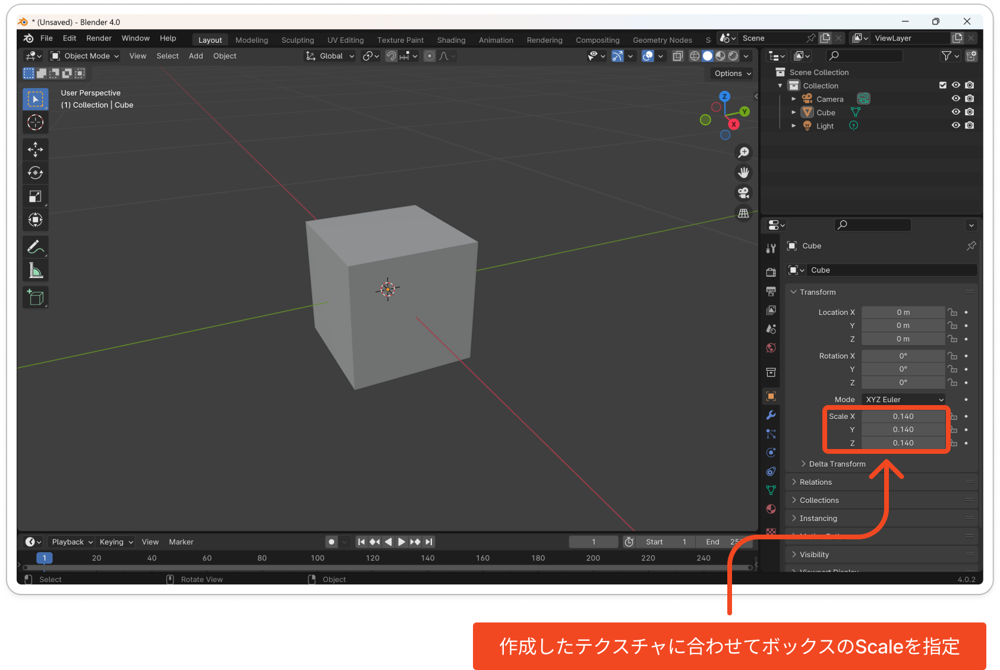

### <a id='toc2_2_2_'></a>[テクスチャの読み込み](#toc0_)

次に、先ほど作成したテクスチャを読み込みます

「Base Color」の横の丸いアイコン → 「Image Texture」→「Open」を選択し、先ほど作成したテクスチャを読み込みます。

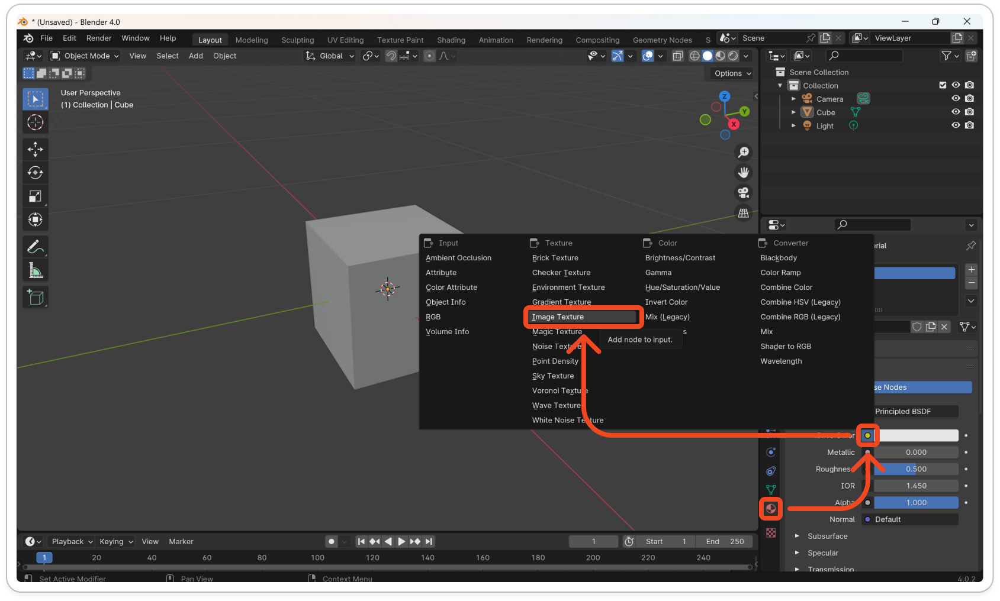

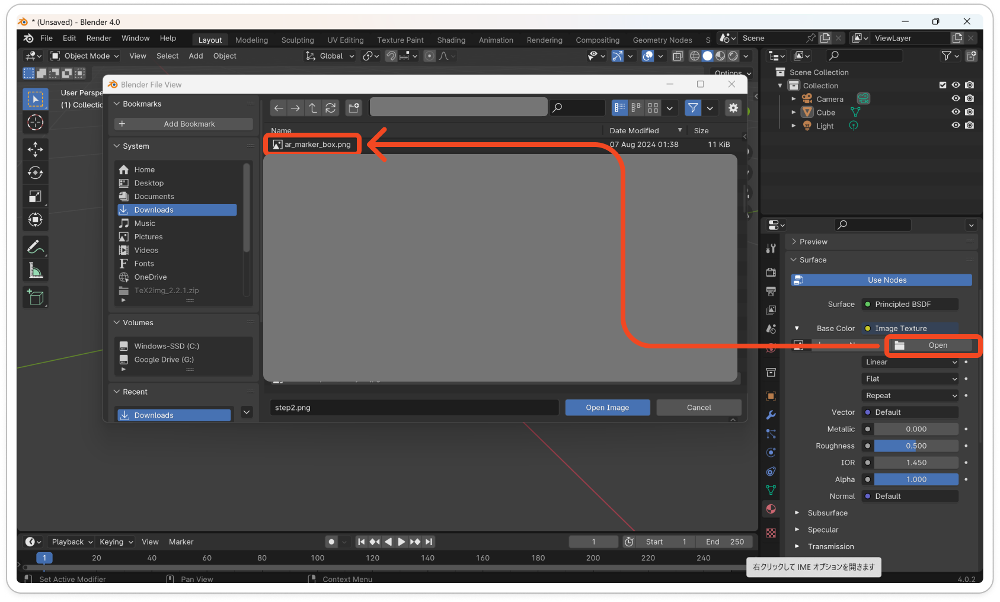

<br>
次に、「Edit Mode」に変更すると、ARマーカのテクスチャが反映されていることが確認できます。

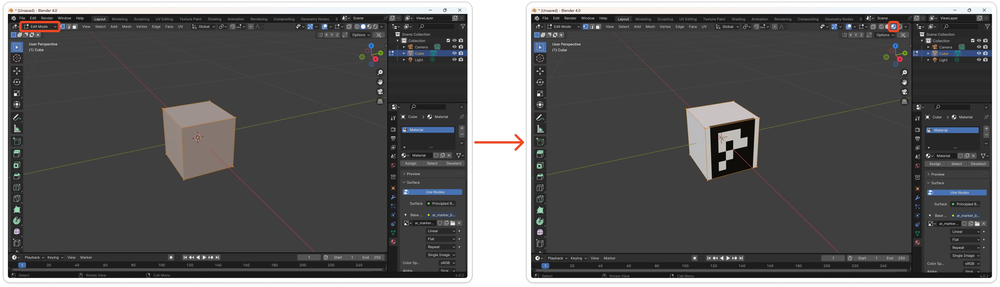

### <a id='toc2_2_3_'></a>[テクスチャのスケールの変更](#toc0_)

ここまでで、ボックスにテクスチャを貼り付けることができましたが、スケールがあっていないので、調整します。

最初に、blenderの画面の左上あたりをスライドし、以下のように二画面表示にします


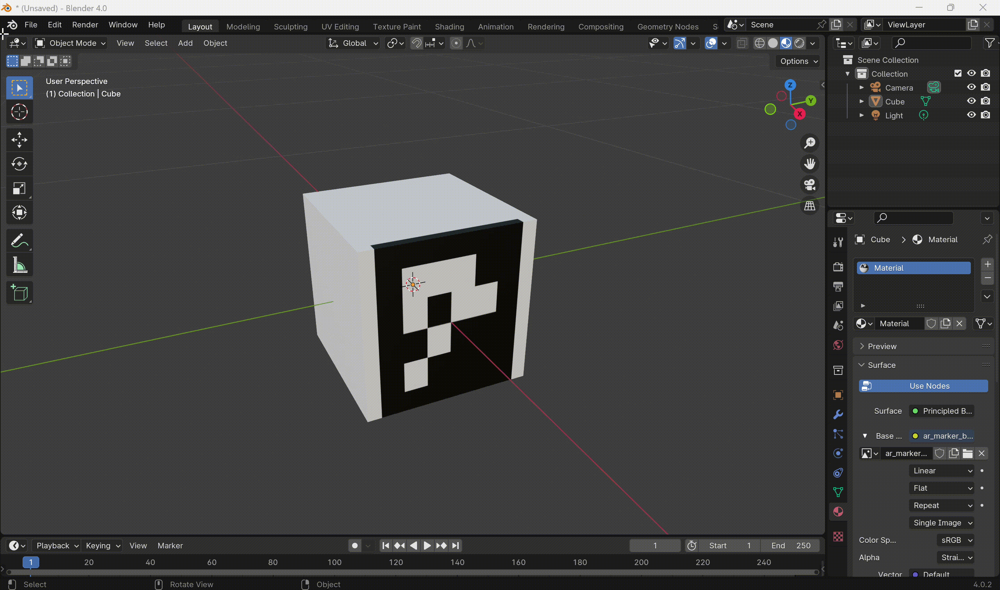

<br>
次に、左側の画面を「UV Editing」に変更します。

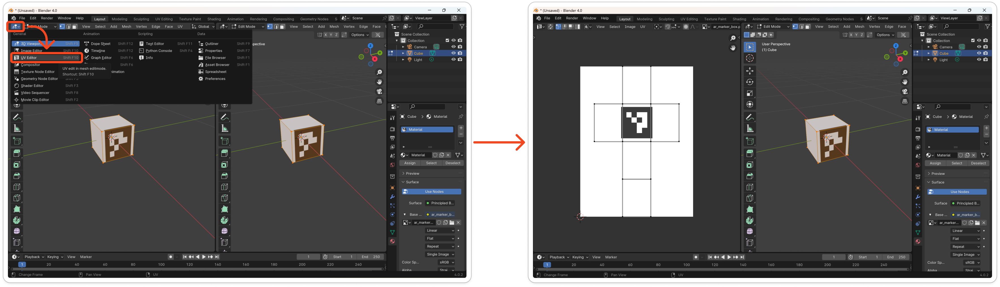

<br>

最後に、x方向のスケールを「1.33333」倍に変更すると、ARマーカのテクスチャが正しく貼り付けられます。

具体的には、
- 左画面で「スケール」のアイコンを選択
- 6面全てを選択
- スケールを少し変更すると、画面下に「Resize」と表示されるので、x方向のスケールを「1.33333」に設定

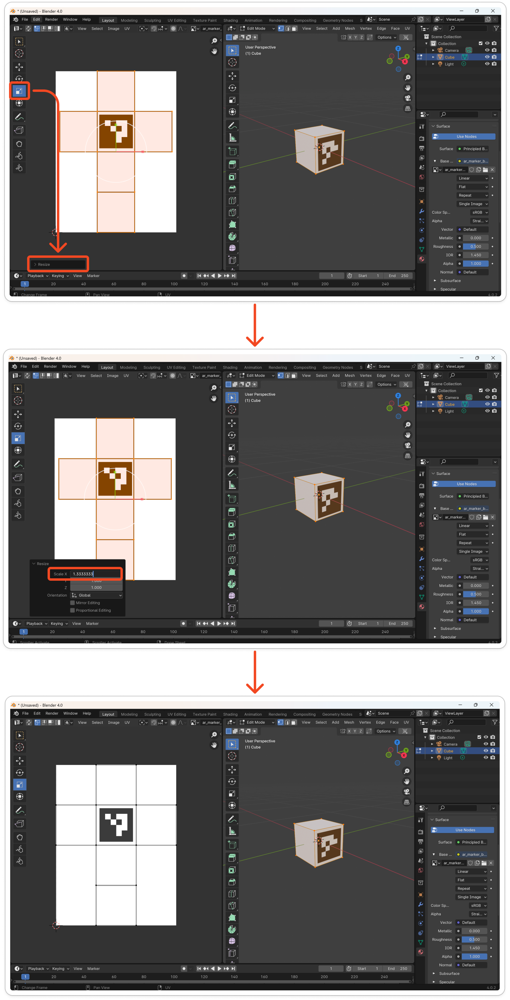

### <a id='toc2_2_4_'></a>[objファイルのエクスポート](#toc0_)

最後に、ボックスをobjファイルとしてエクスポートします。

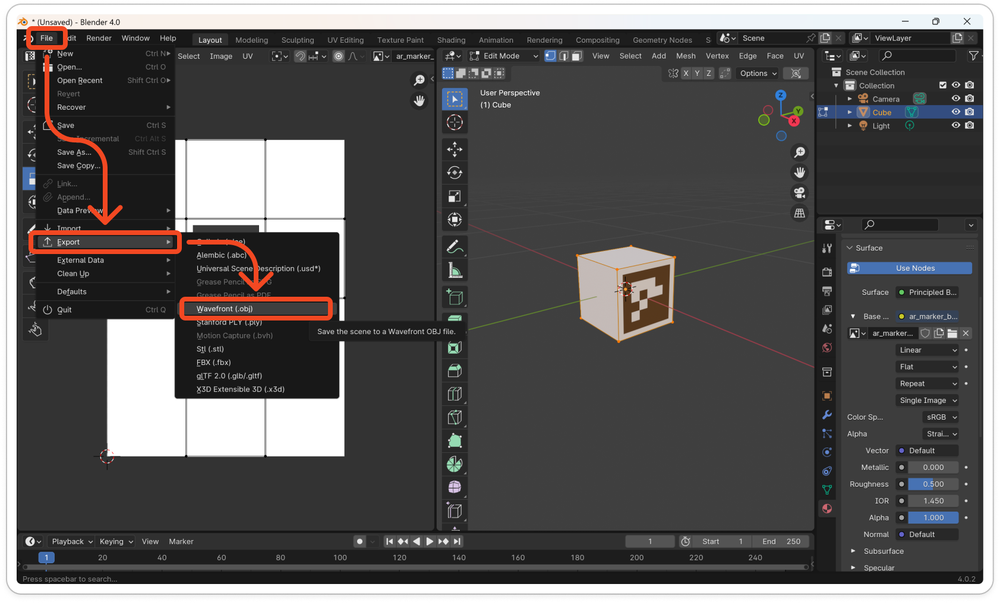

## <a id='toc2_3_'></a>[ARマーカーを貼り付けたボックスのurdfファイルの作成](#toc0_)

Pybulletではurdfファイルを読み込むことができるため、先ほどエクスポートしたobjファイルとテクスチャのpngファイルを使用して、urdfファイルを作成します。

ここで、ポイントは以下になります。

- meshにblenderで作成したobjファイルを指定
- textureにテクスチャのpngファイルを指定
- collisionのサイズは、ボックスのサイズと同じにする
- visualのscaleを0.5倍にする
  - blenderで出力したobjファイルは、pybullet上で2倍の大きさで表示されるため、0.5倍にする（筆者の環境で起こった事象なので、blenderの設定によっては異なるかもしれません）

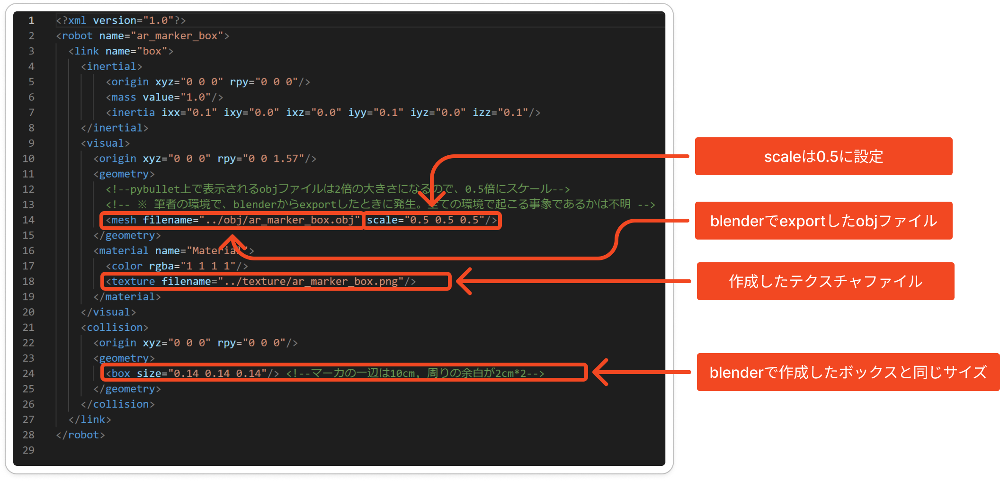

# <a id='toc3_'></a>[Pybulletを用いて、ARマーカを検出](#toc0_)

次に、pybulletを使用して、ARマーカを検出する方法を解説します。

## <a id='toc3_1_'></a>[pybulletの起動](#toc0_)


In [2]:
import pybullet
import pybullet_data
physicsClient = pybullet.connect(pybullet.GUI) 

startThreads creating 1 threads.
starting thread 0


pybullet build time: Nov 28 2023 23:45:17


started thread 0 
argc=2
argv[0] = --unused
argv[1] = --start_demo_name=Physics Server
ExampleBrowserThreadFunc started
X11 functions dynamically loaded using dlopen/dlsym OK!
X11 functions dynamically loaded using dlopen/dlsym OK!
Creating context
Created GL 3.3 context
Direct GLX rendering context obtained
Making context current
GL_VENDOR=Mesa
GL_RENDERER=llvmpipe (LLVM 15.0.7, 256 bits)
GL_VERSION=4.5 (Core Profile) Mesa 23.2.1-1ubuntu3.1~22.04.2
GL_SHADING_LANGUAGE_VERSION=4.50
pthread_getconcurrency()=0
Version = 4.5 (Core Profile) Mesa 23.2.1-1ubuntu3.1~22.04.2
Vendor = Mesa
Renderer = llvmpipe (LLVM 15.0.7, 256 bits)
b3Printf: Selected demo: Physics Server
startThreads creating 1 threads.
starting thread 0
started thread 0 
MotionThreadFunc thread started


## <a id='toc3_2_'></a>[pybulletの初期設定](#toc0_)

床の生成、カメラの設定など、pybulletの初期設定を行います。

In [3]:
pybullet.resetSimulation() # シミュレーション空間をリセット
pybullet.setAdditionalSearchPath(pybullet_data.getDataPath()) # pybulletに必要なデータへのパスを追加
pybullet.setGravity(0.0, 0.0, -9.8) # 地球上における重力に設定
timeStep = 1./240.
pybullet.setTimeStep(timeStep) # 1stepあたりに経過する時間の設定

#床の読み込み
planeId = pybullet.loadURDF("plane.urdf")

# GUIモードの際のカメラの位置などを設定
cameraDistance = 1.0
cameraYaw = -150.0 # deg
cameraPitch = -20 # deg
cameraTargetPosition = [0.0, 0.0, 0.1]
pybullet.resetDebugVisualizerCamera(cameraDistance, cameraYaw, cameraPitch, cameraTargetPosition)


ven = Mesa
ven = Mesa


## <a id='toc3_3_'></a>[カメラ、ARマーカを貼り付けたボックスの生成](#toc0_)

次に、先ほど作成したARマーカを貼り付けたボックスと、そのARマーカを検出するためのカメラのモデルを生成します。


In [4]:
# カメラの読み込み（カメラのサイズが0.1m x 0.1m x 0.1mなので、原点からy軸方向に0.05m移動させ、カメラの正面がピッタリ原点にくるように調整）
simpleCameraId = pybullet.loadURDF("../urdf/simple_camera.urdf", [0.0, 0.05, 0.5], pybullet.getQuaternionFromEuler([0.0, 0.0, -1.57]), useFixedBase=True)

# ARマーカを貼り付けたボックスの読み込み
# ARマーカのボックスの正面～カメラ正面までの距離が1mになるような位置に設定
arMarkerBoxId = pybullet.loadURDF("../urdf/ar_marker_box.urdf", [0.0, -1.07, 0.5], pybullet.getQuaternionFromEuler([0.0, 0.0, 0.0]), useFixedBase=True)
# textureを設定(urdfファイルで指定したものと、同じものを指定)
textureId = pybullet.loadTexture("../texture/ar_marker_box.png")
pybullet.changeVisualShape(arMarkerBoxId, -1, textureUniqueId=textureId)

b3Printf: b3Warning[examples/Importers/ImportURDFDemo/BulletUrdfImporter.cpp,126]:

b3Printf: No inertial data for link, using mass=1, localinertiadiagonal = 1,1,1, identity local inertial frame
b3Printf: b3Warning[examples/Importers/ImportURDFDemo/BulletUrdfImporter.cpp,126]:

b3Printf: target_position_vertual_link


## <a id='toc3_4_'></a>[光源位置の変更](#toc0_)

光源位置を変更して、ARマーカを検出しやすくします。

In [5]:
# デフォルトの光源位置だと、ARマーカが認識されにくいので、光源位置を変更
pybullet.configureDebugVisualizer(lightPosition=[0, 0, 100])

## <a id='toc3_5_'></a>[ARマーカを検出する関数の定義](#toc0_)

取得した画像情報から、ARマーカの位置姿勢を取得する関数を定義します。

In [6]:
import cv2
import numpy as np

def detect_ar_marker_pose(markerSize, arucoDict, parameters, rgbImg, cameraMatrix, distCoeffs):
    """
    最初に検出されたARマーカの中心位置、深度、姿勢を取得する関数
    
    Parameters
    ----------
    markerSize : float
        ARマーカの1辺の長さ（メートル）
    arucoDict : cv2.aruco.Dictionary
        ARマーカの辞書
    parameters : cv2.aruco.DetectorParameters
        ARマーカ検出のパラメータ
    rgbImg : numpy.ndarray
        カメラ画像（RGB）
    cameraMatrix : numpy.ndarray
        カメラの内部パラメータ行列
    distCoeffs : numpy.ndarray
        歪み係数

    Returns
    -------
    marker_pose : numpy.ndarray
        ARマーカの位置と姿勢（x, y, z, roll, pitch, yaw）
    """

    # カメラ画像をOpenCV形式に変換
    bgrImg = cv2.cvtColor(rgbImg, cv2.COLOR_RGB2BGR)

    # ARマーカの検出
    corners, ids, rejectedImgPoints = cv2.aruco.detectMarkers(bgrImg, arucoDict, parameters=parameters)

    # 検出されたマーカがない場合はNoneを返す
    if ids is None or len(ids) == 0:
        return None

    # 最初に検出されたマーカの4隅の位置を取得
    cornerPosition2d = corners[0][0]

    # マーカの4隅の3次元座標
    cornerPosition3d = np.array([[-markerSize/2, -markerSize/2, 0],
                                    [markerSize/2, -markerSize/2, 0],
                                    [markerSize/2, markerSize/2, 0],
                                    [-markerSize/2, markerSize/2, 0]], dtype=np.float32)
    
    # solvePnPでカメラからARマーカまでの距離を求める
    success, rotationVector, translationVector = cv2.solvePnP(cornerPosition3d, cornerPosition2d, cameraMatrix, distCoeffs)

    # マーカの中心位置、深度を取得
    tvec = np.array(translationVector)
    x = tvec[0][0]
    y = tvec[1][0]
    z = tvec[2][0]

    # マーカの姿勢を取得
    rvec = np.array(rotationVector)
    roll = rvec[0][0]
    pitch = rvec[1][0]
    yaw = rvec[2][0]

    # マーカの位置と姿勢を返す
    marker_pose = np.array([x, y, z, roll, pitch, yaw])

    return marker_pose

## <a id='toc3_6_'></a>[カメラに関するパラメータの定義](#toc0_)

ARマーカを検出するカメラのパラメータ等を定義します。

In [7]:
# カメラ設定
fovY = 60 # Pybulletでは、垂直方向のfovを指定
imageWidth = 640
imageHeight = 480
aspect = imageWidth / imageHeight
near = 0.05
far = 10
projectionMatrix = pybullet.computeProjectionMatrixFOV(fovY, aspect, near, far)

# y方向の焦点距離を求める
fovYRad = np.deg2rad(fovY)
fy = imageHeight / (2 * np.tan(fovYRad / 2))

# x方向の焦点距離を求める
fovXRad = 2 * np.arctan(np.tan(fovYRad / 2) * aspect) # x方向のfovは、y方向のfovとアスペクト比から算出
fx = imageWidth / (2 * np.tan(fovXRad / 2))

# カメラの内部パラメータ
cameraMatrix = np.array([[fx, 0, imageWidth/2],
                            [0, fy, imageHeight/2],
                            [0, 0, 1]], dtype=np.float32)

# 歪み係数（ここでは、歪みがないと仮定）
distCoeffs = np.array([0.0, 0.0, 0.0, 0.0, 0.0], dtype=np.float32)

# 「カメラリンク」及び「カメラ画像取得用の仮想的なリンク」のインデックスを指定
cameraLinkIdx = 0
cameraTargetLinkIdx = 1

## <a id='toc3_7_'></a>[debugParameterの定義](#toc0_)

ARマーカを貼り付けたボックスの、位置·姿勢をスライダーで変更するためのパラメータを定義します。

In [8]:
pybullet.addUserDebugParameter("camera x", -4, 4, 0.0)
pybullet.addUserDebugParameter("camera y", -4, 4, -1.07) # ARマーカのボックスの正面～カメラ正面までの距離が1mになるような位置を初期位置に設定
pybullet.addUserDebugParameter("camera z", -4, 8, 0.5)
pybullet.addUserDebugParameter("camera roll", -3.14, 3.14, 0.0)
pybullet.addUserDebugParameter("camera pitch", -3.14, 3.14, 0)
pybullet.addUserDebugParameter("camera yaw", -3.14, 3.14, 0)

5

## <a id='toc3_8_'></a>[ARマーカ検出の実行](#toc0_)

下記コードを実行すると、カメラで検出されたARマーカの位置·姿勢がPybulletのGUI画面上に表示されます。

また、GUI画面右側にあるスライダーを動かすことで、「ARマーカを貼り付けたボックス」の位置・姿勢を変更することができます。

In [9]:
import time

# 検出するARマーカのサイズ（検出するARマーカの一辺の長さを指定）
markerSize = 0.1

# 検出するARマーカの辞書を定義
arucoDict = cv2.aruco.Dictionary_get(cv2.aruco.DICT_4X4_50)
parameters = cv2.aruco.DetectorParameters_create()

while True:
    # スライダーに設定された値を取得
    cameraX = pybullet.readUserDebugParameter(0)
    cameraY = pybullet.readUserDebugParameter(1)
    cameraZ = pybullet.readUserDebugParameter(2)
    cameraRoll = pybullet.readUserDebugParameter(3)
    cameraPitch = pybullet.readUserDebugParameter(4)
    camerayaw = pybullet.readUserDebugParameter(5)

    # ARマーカを貼り付けたボックスの位置と姿勢を更新
    pybullet.resetBasePositionAndOrientation(arMarkerBoxId, [cameraX, cameraY, cameraZ], pybullet.getQuaternionFromEuler([cameraRoll, cameraPitch, camerayaw]))

    # カメラの位置を取得
    cameraLinkPose = pybullet.getLinkState(simpleCameraId, cameraLinkIdx)[0] # 手先のカメラリンクの位置
    cameraTargetLinkPose = pybullet.getLinkState(simpleCameraId, cameraTargetLinkIdx)[0] # カメラリンクの少しだけ前に設定した仮想的なリンクの位置

    # カメラのビュー行列を計算
    viewMatrix = pybullet.computeViewMatrix(cameraEyePosition=[cameraLinkPose[0], cameraLinkPose[1], cameraLinkPose[2]],cameraTargetPosition=[cameraTargetLinkPose[0], cameraTargetLinkPose[1], cameraTargetLinkPose[2]],cameraUpVector=[0, 0, 1])

    # カメラ画像を取得
    _, _, rgbImg, _, _ = pybullet.getCameraImage(
        width=imageWidth,
        height=imageHeight,
        viewMatrix=viewMatrix,
        projectionMatrix=projectionMatrix,
        renderer=pybullet.ER_BULLET_HARDWARE_OPENGL
    )

    # ARマーカの位置、姿勢を取得
    markerPose = detect_ar_marker_pose(markerSize, arucoDict, parameters, rgbImg, cameraMatrix, distCoeffs)
    
    # 検出できなかった場合、次のループへ
    if markerPose is None:
        continue

    # ARマーカの位置、姿勢を表示
    x = markerPose[0]
    y = markerPose[2]
    z = -markerPose[1]
    roll = -markerPose[3]
    pitch = -markerPose[5]
    yaw = -markerPose[4]
    pybullet.addUserDebugText(f"marker pose ({x:.2f}, {y:.2f}, {z:.2f}, {np.rad2deg(roll):.2f}, {np.rad2deg(pitch):.2f}, {np.rad2deg(yaw):.2f})", [1.2, 0, 0], textColorRGB=[1, 0, 0], textSize=1.5, lifeTime=0.5)

    time.sleep(timeStep)
        